In [107]:
import librosa
import soundfile
import os, glob, pickle
import numpy as np

# Necessary Imports
from sklearn.model_selection import train_test_split

from sklearn import metrics
import xgboost as xgb
from xgboost import plot_importance

from sklearn.metrics import roc_auc_score
import joblib
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import xgboost
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
import lightgbm as lgb
import numpy as np
import pandas as pd
import keras
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Dense, Embedding
from tensorflow.keras.utils import to_categorical
from keras.layers import Input, Flatten, Dropout, Activation
from keras.layers import Conv1D, MaxPooling1D
from keras.models import Model
from keras.callbacks import ModelCheckpoint
from tensorflow.keras import optimizers

from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.layers import LSTM, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint

import plotly.graph_objects as go
import plotly.express as px
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import log_loss

import warnings
warnings.filterwarnings("ignore")

In [108]:
import pandas as pd
# Define functions

def plot_roc_curve(y_scores, y_onehot):
    fig = go.Figure()
    fig.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=0, y1=1
    )

    for i in range(y_scores.shape[1]):
        y_true = y_onehot.iloc[:, i]
        y_score = y_scores[:, i]

        fpr, tpr, _ = roc_curve(y_true, y_score)
        auc_score = roc_auc_score(y_true, y_score)

        name = f"{y_onehot.columns[i]} (AUC={auc_score:.2f})"
        fig.add_trace(go.Scatter(x=fpr, y=tpr, name=name, mode='lines'))

    fig.update_layout(
        title='ROC Curve',
        xaxis_title='False Positive Rate',
        yaxis_title='True Positive Rate',
        yaxis=dict(scaleanchor="x", scaleratio=1),
        xaxis=dict(constrain='domain'),
        width=700, height=500
    )
    fig.show()

def plot_precision_recall(y_scores, y_onehot):
    fig = go.Figure()
    fig.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=1, y1=0
    )

    for i in range(y_scores.shape[1]):
        y_true = y_onehot.iloc[:, i]
        y_score = y_scores[:, i]

        precision, recall, _ = precision_recall_curve(y_true, y_score)
        auc_score = average_precision_score(y_true, y_score)

        name = f"{y_onehot.columns[i]} (AP={auc_score:.2f})"
        fig.add_trace(go.Scatter(x=recall, y=precision, name=name, mode='lines'))

    fig.update_layout(
        title='Precision-Recall Curve',
        xaxis_title='Recall',
        yaxis_title='Precision',
        yaxis=dict(scaleanchor="x", scaleratio=1),
        xaxis=dict(constrain='domain'),
        width=700, height=500
    )
    fig.show()

### Model Building

In [109]:
X = joblib.load('C:/Users/admin/Desktop/SER/SER/asvp-esd_features/X.joblib')
y = joblib.load('C:/Users/admin/Desktop/SER/SER/asvp-esd_features/y.joblib')

In [110]:
pd.DataFrame(X).head()

,0,1,2,3,4,5,6,7,8,9,...,170,171,172,173,174,175,176,177,178,179
0,-228.177704,46.280769,8.835920,7.454020,-4.307202,5.290224,-3.441139,4.296049,-11.256043,6.755314,...,0.033472,0.028632,0.028415,0.027503,0.030012,0.026778,0.020862,0.008832,0.001274,3.434442e-05
1,-194.128189,82.746132,5.893669,33.133125,4.754503,11.673182,-8.425924,7.141459,-0.944849,4.772406,...,0.022447,0.065495,0.087725,0.050296,0.042598,0.046381,0.019816,0.004441,0.000360,1.474665e-05
2,-218.465439,44.856365,3.230396,10.180256,-7.974222,7.181274,-9.564536,2.808441,-12.498414,2.931447,...,0.093847,0.077826,0.053869,0.038603,0.049086,0.046645,0.028943,0.011132,0.001725,5.738167e-05
3,-350.106720,136.196960,1.808602,19.713015,-2.828843,0.236722,-7.260847,-14.395394,-0.518825,-5.860861,...,0.000245,0.000296,0.000213,0.000278,0.000244,0.000179,0.000134,0.000074,0.000023,5.828666e-07
4,-169.135941,59.412437,-60.433151,1.566656,-27.881262,-5.016341,-26.356571,-0.942858,-8.426341,1.671956,...,0.010224,0.009323,0.006510,0.005778,0.006139,0.005351,0.003270,0.001660,0.000310,1.094756e-05


In [45]:
len(y)

10957

In [46]:
pd.DataFrame(y).value_counts()

2    1674
3    1658
4    1436
5    1369
8    1312
6    1113
1    1112
7     749
9     329
0     205
dtype: int64

In [7]:
emotions = {0 : 'Boredom', 1 : 'Calm', 2 : 'Happy', 3 : 'Sad', 4 : 'Angry', 5 : 'Fearful', 6 : 'Disgust', 7 : 'Surprise', 8 : 'Excited', 9 : 'Pleasure'}
data = np.vectorize(emotions.get)(y)

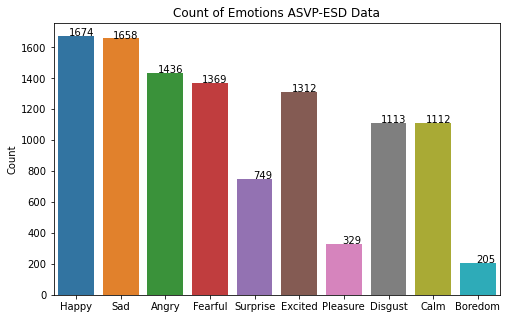

In [8]:
import seaborn as sns
plt.figure(figsize=(8,5))
ax = sns.countplot(data)

ax.set(ylabel='Count', title='Count of Emotions ASVP-ESD Data')

for p in ax.patches:
    count = p.get_height()
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(count, (x, y),ha='right')
plt.show()

In [111]:
from imblearn.over_sampling import SMOTE

X = joblib.load('C:/Users/admin/Desktop/SER/SER/asvp-esd_features/X.joblib')
y = joblib.load('C:/Users/admin/Desktop/SER/SER/asvp-esd_features/y.joblib')
oversample = SMOTE()
X, y = oversample.fit_resample(X, y)

In [112]:
pd.DataFrame(y).value_counts()

0    1674
1    1674
2    1674
3    1674
4    1674
5    1674
6    1674
7    1674
8    1674
9    1674
dtype: int64

In [113]:
x_train,x_test,y_train,y_test=train_test_split(X, y, test_size=0.2, random_state=9)

In [114]:
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [115]:
print((x_train.shape[0], x_test.shape[0]))

(13392, 3348)


In [116]:
print(f'Features extracted: {x_train.shape[1]}')

Features extracted: 180


### SVM

In [117]:
m6 = SVC(kernel = 'rbf', probability=True).fit(x_train, y_train)
y_pred = m6.predict(x_test)
y_proba = m6.predict_proba(x_test)
accuracy = accuracy_score(y_true=y_test, y_pred=y_pred)
# Print the accuracy
print("Accuracy: {:.2f}%".format(accuracy*100))
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
y_onehot = pd.get_dummies(y_test, columns=m6.classes_)
plot_roc_curve(y_proba, y_onehot)
plot_precision_recall(y_proba, y_onehot)

Accuracy: 57.44%
[[297   9  10   3   2   4   2   6  11   7]
 [ 14 187  10   6  25  13  29  37  19  15]
 [ 13  11 186  14  22  21   5  21  21  23]
 [ 11  22  50 118  21  30  27  14  20  16]
 [  5  14  29  21 185  19   9   9  22  10]
 [  6  32  24  30   8 173  12  13  10  15]
 [  5  25   6  18   8  11 216  12  10   2]
 [ 24  24  34  16  10   6   5 171  26  26]
 [ 15  16  48  14  25  17  18  25 131  12]
 [  8   8  20   5   9  24   8  10   3 259]]
              precision    recall  f1-score   support

           0       0.75      0.85      0.79       351
           1       0.54      0.53      0.53       355
           2       0.45      0.55      0.49       337
           3       0.48      0.36      0.41       329
           4       0.59      0.57      0.58       323
           5       0.54      0.54      0.54       323
           6       0.65      0.69      0.67       313
           7       0.54      0.50      0.52       342
           8       0.48      0.41      0.44       321
           

In [118]:
joblib.dump(m6, 'svm_asvp_model.joblib') 

['svm_asvp_model.joblib']

In [119]:
balanced_accuracy_score(y_test, y_pred)

0.5721698893223598

In [120]:
precision_score(y_test, y_pred, average="weighted")

0.5696591148227

In [121]:
recall_score(y_test, y_pred, average="weighted")

0.5743727598566308

In [122]:
f1_score(y_test, y_pred, average="weighted")

0.5696923566218163

In [123]:
roc_auc_score(y_test, y_proba, average="weighted", multi_class="ovr")

0.8880732610342272

In [124]:
cohen_kappa_score(y_test, y_pred)

0.5268837506895832

In [125]:
log_loss(y_test, y_proba)

1.330755465866152

### KNeighbors

In [126]:
from sklearn.neighbors import KNeighborsClassifier
m2 = KNeighborsClassifier(n_neighbors=5)
m2.fit(x_train, y_train)
y_pred = m2.predict(x_test)
y_proba = m2.predict_proba(x_test)
accuracy = accuracy_score(y_true=y_test, y_pred=y_pred)
# Print the accuracy
print("Accuracy: {:.2f}%".format(accuracy*100))
print(classification_report(y_test,y_pred))
print(confusion_matrix(y_test,y_pred))
columns = m2.classes_
y_onehot = pd.get_dummies(y_test, columns=m2.classes_)
plot_roc_curve(y_proba, y_onehot)
plot_precision_recall(y_proba, y_onehot)

Accuracy: 63.41%
              precision    recall  f1-score   support

           0       0.73      0.99      0.84       351
           1       0.64      0.57      0.60       355
           2       0.51      0.49      0.50       337
           3       0.52      0.35      0.42       329
           4       0.62      0.64      0.63       323
           5       0.55      0.61      0.58       323
           6       0.80      0.64      0.71       313
           7       0.60      0.75      0.67       342
           8       0.70      0.30      0.42       321
           9       0.66      0.95      0.78       354

    accuracy                           0.63      3348
   macro avg       0.63      0.63      0.61      3348
weighted avg       0.63      0.63      0.62      3348

[[349   0   0   0   0   0   0   1   0   1]
 [ 22 201  11  10  14  18  12  42   8  17]
 [ 24   9 164  11  25  31   2  21  13  37]
 [ 15  23  50 116  19  39   8  24   4  31]
 [ 10  15  17  18 207  19   5  10   4  18]
 [ 11  17

In [127]:
joblib.dump(m2, 'knn_asvp_model.joblib') 

['knn_asvp_model.joblib']

In [128]:
balanced_accuracy_score(y_test, y_pred)

0.6288520083231255

In [129]:
precision_score(y_test, y_pred, average="weighted")

0.633301821548658

In [130]:
recall_score(y_test, y_pred, average="weighted")

0.6341099163679809

In [131]:
f1_score(y_test, y_pred, average="weighted")

0.6174084520651082

In [132]:
roc_auc_score(y_test, y_proba, average="weighted", multi_class="ovr")

0.8964633232189232

In [133]:
cohen_kappa_score(y_test, y_pred)

0.5930146132889615

In [134]:
log_loss(y_test, y_proba)

5.164020507736091

### MLP

In [135]:
model=MLPClassifier(alpha=0.01, batch_size=256, epsilon=1e-08, hidden_layer_sizes=(300,), learning_rate='adaptive', max_iter=500)
model.fit(x_train,y_train)
y_pred = model.predict(x_test)
y_proba = model.predict_proba(x_test)
accuracy = accuracy_score(y_true=y_test, y_pred=y_pred)
# Print the accuracy
print("Accuracy: {:.2f}%".format(accuracy*100))
print(classification_report(y_test,y_pred))
print(confusion_matrix(y_test,y_pred))
y_onehot = pd.get_dummies(y_test, columns=model.classes_)
plot_roc_curve(y_proba, y_onehot)
plot_precision_recall(y_proba, y_onehot)

Accuracy: 71.39%
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       351
           1       0.68      0.63      0.65       355
           2       0.60      0.47      0.53       337
           3       0.54      0.49      0.52       329
           4       0.63      0.68      0.66       323
           5       0.63      0.65      0.64       323
           6       0.77      0.81      0.79       313
           7       0.75      0.82      0.78       342
           8       0.61      0.62      0.62       321
           9       0.89      0.95      0.92       354

    accuracy                           0.71      3348
   macro avg       0.70      0.71      0.71      3348
weighted avg       0.71      0.71      0.71      3348

[[347   3   0   0   0   0   0   0   1   0]
 [  3 222  14  16  20  15  19  19  23   4]
 [  5   5 159  29  36  28   3  22  40  10]
 [  2  18  27 161  27  29  23  11  23   8]
 [  1  15  14  22 221  16   8   7  16   3]
 [  1  25

In [136]:
joblib.dump(model, 'mlp_asvp_model.joblib') 

['mlp_asvp_model.joblib']

In [137]:
balanced_accuracy_score(y_test, y_pred)

0.7111715736318962

In [138]:
precision_score(y_test, y_pred, average="weighted")

0.7076671014863576

In [139]:
recall_score(y_test, y_pred, average="weighted")

0.7138590203106332

In [140]:
f1_score(y_test, y_pred, average="weighted")

0.7092724333135987

In [141]:
roc_auc_score(y_test, y_proba, average="weighted", multi_class="ovr")

0.9206824458528554

In [142]:
cohen_kappa_score(y_test, y_pred)

0.6820148426860868

In [143]:
log_loss(y_test, y_proba)

1.8691756348658235

### XGBoost

In [144]:
m1 = XGBClassifier()
m1.fit(x_train,y_train)
y_pred = m1.predict(x_test)
y_proba = m1.predict_proba(x_test)
accuracy = accuracy_score(y_true=y_test, y_pred=y_pred)
# Print the accuracy
print("Accuracy: {:.2f}%".format(accuracy*100))
print(classification_report(y_test,y_pred))
print(confusion_matrix(y_test,y_pred))
y_onehot = pd.get_dummies(y_test, columns=m1.classes_)
plot_roc_curve(y_proba, y_onehot)
plot_precision_recall(y_proba, y_onehot)

[14:11:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy: 72.94%
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       351
           1       0.74      0.67      0.71       355
           2       0.59      0.60      0.59       337
           3       0.57      0.51      0.54       329
           4       0.72      0.70      0.71       323
           5       0.66      0.66      0.66       323
           6       0.81      0.77      0.79       313
           7       0.74      0.83      0.78       342
           8       0.64      0.58      0.61       321
           9       0.83      0.96      0.89       354

    accuracy                           0.73      3348
   macro avg       0.7

In [145]:
joblib.dump(m1, 'xgb_asvp_model.joblib') 

['xgb_asvp_model.joblib']

In [146]:
balanced_accuracy_score(y_test, y_pred)

0.7259984692767085

In [147]:
precision_score(y_test, y_pred, average="weighted")

0.7250947774795365

In [148]:
recall_score(y_test, y_pred, average="weighted")

0.7293906810035843

In [149]:
f1_score(y_test, y_pred, average="weighted")

0.7258757405060012

In [150]:
roc_auc_score(y_test, y_proba, average="weighted", multi_class="ovr")

0.9526464673318719

In [151]:
cohen_kappa_score(y_test, y_pred)

0.6992012483797531

In [152]:
log_loss(y_test, y_proba)

0.8413474056620432

### LightGBM

In [153]:
lgb_model = lgb.LGBMClassifier(learning_rate=0.2,max_depth=-5,random_state=42)
lgb_model.fit(x_train,y_train,eval_set=[(x_test,y_test),(x_train,y_train)],
          verbose=10)
y_pred = lgb_model.predict(x_test)
y_proba = lgb_model.predict_proba(x_test)
accuracy = accuracy_score(y_true=y_test, y_pred=y_pred)
# Print the accuracy
print("Accuracy: {:.2f}%".format(accuracy*100))
print(classification_report(y_test,y_pred))
print(confusion_matrix(y_test,y_pred))
y_onehot = pd.get_dummies(y_test, columns=lgb_model.classes_)
plot_roc_curve(y_proba, y_onehot)
plot_precision_recall(y_proba, y_onehot)

[10]	training's multi_logloss: 0.864939	valid_0's multi_logloss: 1.32127
[20]	training's multi_logloss: 0.488747	valid_0's multi_logloss: 1.12704
[30]	training's multi_logloss: 0.29781	valid_0's multi_logloss: 1.02325
[40]	training's multi_logloss: 0.187975	valid_0's multi_logloss: 0.96157
[50]	training's multi_logloss: 0.120109	valid_0's multi_logloss: 0.924235
[60]	training's multi_logloss: 0.0777492	valid_0's multi_logloss: 0.899499
[70]	training's multi_logloss: 0.0511447	valid_0's multi_logloss: 0.88299
[80]	training's multi_logloss: 0.0344379	valid_0's multi_logloss: 0.866125
[90]	training's multi_logloss: 0.0239167	valid_0's multi_logloss: 0.867654
[100]	training's multi_logloss: 0.0169304	valid_0's multi_logloss: 0.864638
Accuracy: 73.51%
              precision    recall  f1-score   support

           0       0.95      0.98      0.97       351
           1       0.72      0.69      0.70       355
           2       0.59      0.61      0.60       337
           3       0.57   

In [154]:
joblib.dump(lgb_model, 'lgb_asvp_model.joblib') 

['lgb_asvp_model.joblib']

In [155]:
balanced_accuracy_score(y_test, y_pred)

0.7320185466427563

In [156]:
precision_score(y_test, y_pred, average="weighted")

0.7318446097467914

In [157]:
recall_score(y_test, y_pred, average="weighted")

0.7350657108721624

In [158]:
f1_score(y_test, y_pred, average="weighted")

0.7326738555015707

In [159]:
roc_auc_score(y_test, y_proba, average="weighted", multi_class="ovr")

0.952815689445545

In [160]:
cohen_kappa_score(y_test, y_pred)

0.7055319916885519

In [161]:
log_loss(y_test, y_proba)

0.8646378089506489

### CNN

In [165]:
x_traincnn = np.expand_dims(x_train, axis=2)
x_testcnn = np.expand_dims(x_test, axis=2)

x_traincnn = np.array(x_traincnn)
x_testcnn = np.array(x_testcnn)
#y_train = np.array(y_train)
#y_test = np.array(y_test)

model = Sequential()

model.add(Conv1D(64, 5,padding='same',
                 input_shape=(180,1)))
model.add(Activation('relu'))
model.add(Dropout(0.1))
model.add(MaxPooling1D(pool_size=(4)))

model.add(Conv1D(128, 5,padding='same',))
model.add(Activation('relu'))
model.add(Dropout(0.1))
model.add(MaxPooling1D(pool_size=(4)))

model.add(Conv1D(256, 5,padding='same',))
model.add(Activation('relu'))
model.add(Dropout(0.1))
model.add(Flatten())
model.add(Dense(10))
model.add(Activation('softmax'))
opt = optimizers.RMSprop(lr=0.00005, rho=0.9, epsilon=1e-07, decay=0.0)
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 180, 64)           384       
                                                                 
 activation_4 (Activation)   (None, 180, 64)           0         
                                                                 
 dropout_3 (Dropout)         (None, 180, 64)           0         
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 45, 64)           0         
 1D)                                                             
                                                                 
 conv1d_4 (Conv1D)           (None, 45, 128)           41088     
                                                                 
 activation_5 (Activation)   (None, 45, 128)           0         
                                                      

In [166]:
model.compile(loss = 'sparse_categorical_crossentropy',
              optimizer = opt,
              metrics = ['accuracy'])
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)
cnnhistory = model.fit(x_traincnn, y_train, batch_size=16, epochs=200, validation_data = (x_testcnn, y_test), callbacks=[callback])

Epoch 1/200
837/837 [==============================] - 11s 12ms/step - loss: 2.1475 - accuracy: 0.2328 - val_loss: 2.0697 - val_accuracy: 0.2826
Epoch 2/200
837/837 [==============================] - 10s 12ms/step - loss: 2.0202 - accuracy: 0.2997 - val_loss: 1.9982 - val_accuracy: 0.3076
Epoch 3/200
837/837 [==============================] - 10s 12ms/step - loss: 1.9523 - accuracy: 0.3293 - val_loss: 1.9563 - val_accuracy: 0.3363
Epoch 4/200
837/837 [==============================] - 10s 13ms/step - loss: 1.9002 - accuracy: 0.3551 - val_loss: 1.9113 - val_accuracy: 0.3519
Epoch 5/200
837/837 [==============================] - 11s 13ms/step - loss: 1.8520 - accuracy: 0.3715 - val_loss: 1.8643 - val_accuracy: 0.3701
Epoch 6/200
837/837 [==============================] - 11s 13ms/step - loss: 1.8091 - accuracy: 0.3880 - val_loss: 1.8295 - val_accuracy: 0.3967
Epoch 7/200
837/837 [==============================] - 11s 13ms/step - loss: 1.7743 - accuracy: 0.4064 - val_loss: 1.7971 - val_ac

837/837 [==============================] - 19s 23ms/step - loss: 0.6281 - accuracy: 0.7924 - val_loss: 1.0542 - val_accuracy: 0.6789
Epoch 114/200
837/837 [==============================] - 19s 23ms/step - loss: 0.6235 - accuracy: 0.7939 - val_loss: 1.0702 - val_accuracy: 0.6673
Epoch 115/200
837/837 [==============================] - 19s 23ms/step - loss: 0.6151 - accuracy: 0.8006 - val_loss: 1.0527 - val_accuracy: 0.6750
Epoch 116/200
837/837 [==============================] - 19s 23ms/step - loss: 0.6095 - accuracy: 0.7972 - val_loss: 1.0724 - val_accuracy: 0.6694
Epoch 117/200
837/837 [==============================] - 21s 26ms/step - loss: 0.6076 - accuracy: 0.7994 - val_loss: 1.0467 - val_accuracy: 0.6738
Epoch 118/200
837/837 [==============================] - 22s 26ms/step - loss: 0.6033 - accuracy: 0.8026 - val_loss: 1.0510 - val_accuracy: 0.6798
Epoch 119/200
837/837 [==============================] - 22s 26ms/step - loss: 0.5966 - accuracy: 0.8005 - val_loss: 1.0596 - val_ac

Epoch 169/200
837/837 [==============================] - 19s 23ms/step - loss: 0.4131 - accuracy: 0.8641 - val_loss: 1.0684 - val_accuracy: 0.7082
Epoch 170/200
837/837 [==============================] - 19s 23ms/step - loss: 0.4072 - accuracy: 0.8708 - val_loss: 1.0724 - val_accuracy: 0.6944
Epoch 171/200
837/837 [==============================] - 20s 23ms/step - loss: 0.4169 - accuracy: 0.8647 - val_loss: 1.0699 - val_accuracy: 0.7004
Epoch 172/200
837/837 [==============================] - 19s 23ms/step - loss: 0.3974 - accuracy: 0.8666 - val_loss: 1.0658 - val_accuracy: 0.7091
Epoch 173/200
837/837 [==============================] - 19s 22ms/step - loss: 0.3999 - accuracy: 0.8696 - val_loss: 1.0832 - val_accuracy: 0.6980
Epoch 174/200
837/837 [==============================] - 19s 23ms/step - loss: 0.4000 - accuracy: 0.8727 - val_loss: 1.0705 - val_accuracy: 0.7103
Epoch 175/200
837/837 [==============================] - 20s 23ms/step - loss: 0.3857 - accuracy: 0.8754 - val_loss: 1

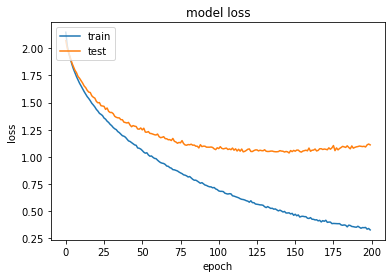

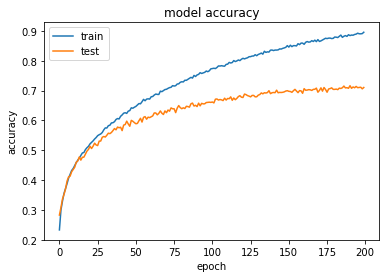

In [167]:
plt.plot(cnnhistory.history['loss'])
plt.plot(cnnhistory.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

plt.plot(cnnhistory.history['accuracy'])
plt.plot(cnnhistory.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [168]:
model.save('cnn_asvp_model.h5')

In [169]:
y_pred = np.argmax(model.predict(x_testcnn), axis=-1)
y_proba = model.predict(x_testcnn)
accuracy = accuracy_score(y_true=y_test.astype(int), y_pred=y_pred)
# Print the accuracy
print("Accuracy: {:.2f}%".format(accuracy*100))
print(classification_report(y_test.astype(int), y_pred))
print(confusion_matrix(y_test.astype(int), y_pred))
#y_onehot = pd.get_dummies(y_test, columns=m1.classes_)
#plot_roc_curve(y_proba, y_onehot)
#plot_precision_recall(y_proba, y_onehot)

Accuracy: 71.03%
              precision    recall  f1-score   support

           0       0.93      0.98      0.95       351
           1       0.62      0.67      0.64       355
           2       0.61      0.44      0.51       337
           3       0.56      0.48      0.51       329
           4       0.68      0.72      0.70       323
           5       0.65      0.63      0.64       323
           6       0.75      0.81      0.78       313
           7       0.76      0.82      0.79       342
           8       0.60      0.57      0.59       321
           9       0.85      0.96      0.90       354

    accuracy                           0.71      3348
   macro avg       0.70      0.71      0.70      3348
weighted avg       0.70      0.71      0.70      3348

[[344   0   1   0   1   0   0   3   2   0]
 [  3 238   3  11  15  13  24  14  27   7]
 [  5  18 147  27  25  31   7  21  34  22]
 [  3  31  19 157  27  29  21  14  18  10]
 [  0  16  12  36 232  10   6   5   5   1]
 [  0  26

In [170]:
balanced_accuracy_score(y_test, y_pred)

0.7071758143905567

In [171]:
precision_score(y_test, y_pred, average="weighted")

0.701776700287377

In [172]:
recall_score(y_test, y_pred, average="weighted")

0.7102747909199522

In [173]:
f1_score(y_test, y_pred, average="weighted")

0.7034555557784905

In [175]:
roc_auc_score(y_test, y_proba, average='weighted', multi_class="ovr")

0.9380060026129259

In [176]:
cohen_kappa_score(y_test, y_pred)

0.6779660882492468

In [177]:
log_loss(y_test, y_proba)

1.0994224338037004

### Comparison

In [181]:
from tabulate import tabulate
print('Results of ASVP-ESD Dataset')
print(" -----------------------------------------------------------------------------")
print(tabulate({"" : ["Accuracy", "AUC", "Cohen’s kappa", "Log Loss", "Precision", "Recall", "F1-score"],
                "SVM" : [0.5744, 0.8880, 0.5268, 1.3307,0.5696,0.5743,0.5696],
                "KNN" : [0.6341, 0.8964, 0.5930, 5.164,0.6333,0.6341,0.6174],
                "MLP":[0.7139, 0.9206, 0.6820, 1.8691,0.7076,0.7138,0.7092],
                "XGBoost":[0.7294, 0.9526, 0.6992, 0.8413,0.7250,0.7293,0.7258],
                "LightGBM":[0.7351, 0.9528, 0.7055, 0.8646,0.7318,0.7350,0.7326],
                "CNN":[0.7103,0.9380, 0.6779, 1.0994, 0.7017,0.7102,0.7034]
        },headers = "keys",tablefmt = 'github'))
print(" -----------------------------------------------------------------------------")

Results of ASVP-ESD Dataset
 -----------------------------------------------------------------------------
|               |    SVM |    KNN |    MLP |   XGBoost |   LightGBM |    CNN |
|---------------|--------|--------|--------|-----------|------------|--------|
| Accuracy      | 0.5744 | 0.6341 | 0.7139 |    0.7294 |     0.7351 | 0.7103 |
| AUC           | 0.888  | 0.8964 | 0.9206 |    0.9526 |     0.9528 | 0.938  |
| Cohen’s kappa | 0.5268 | 0.593  | 0.682  |    0.6992 |     0.7055 | 0.6779 |
| Log Loss      | 1.3307 | 5.164  | 1.8691 |    0.8413 |     0.8646 | 1.0994 |
| Precision     | 0.5696 | 0.6333 | 0.7076 |    0.725  |     0.7318 | 0.7017 |
| Recall        | 0.5743 | 0.6341 | 0.7138 |    0.7293 |     0.735  | 0.7102 |
| F1-score      | 0.5696 | 0.6174 | 0.7092 |    0.7258 |     0.7326 | 0.7034 |
 -----------------------------------------------------------------------------
